<a href="https://colab.research.google.com/github/ShardulJunagade/es335-assignment-2-private/blob/Soham/Task2/ImageReconstructionF.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Image Reconstruction

Choose any image you like. Use Random Fourier Features (RFF) and Linear Regression to learn the mapping from the image coordinates (X, Y) to the pixel colors (R, G, B). Here, (X, Y) represents the coordinates of the pixels, and (R, G, B) represents the color values at those coordinates.

1. **Load Image**: Select any image of your choice.
2. **Random Fourier Features (RFF)**: Implement RFF to map pixel coordinates to color values.
3. **Linear Regression**: Use linear regression to learn the mapping.
4. **Display Results**: Show both the original and reconstructed images.
5. **Metrics**: Calculate the Root Mean Squared Error (MSE) and Peak Signal-to-Noise Ratio (PSNR) between the original and reconstructed images.

**Key Variables**:
- X, Y: Pixel coordinates.
- R, G, B: Pixel color values.


## Importing necessary libraries

In [ ]:
import torch
import torchvision
import torchvision.transforms as transforms
from torch import nn, optim
from torch.utils.data import DataLoader, TensorDataset
from torch.cuda.amp import autocast, GradScaler

import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec

import numpy as np
import pandas as pd
import torch.nn as nn
import torch.nn.functional as F

# Remove all the warnings
import warnings
warnings.filterwarnings('ignore')

# Set env CUDA_LAUNCH_BLOCKING=1
import os
os.environ['CUDA_LAUNCH_BLOCKING'] = '1'
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("Device: ",device)

# Retina display
%config InlineBackend.figure_format = 'retina'

try:
    from einops import rearrange
except ImportError:
    %pip install einops
    from einops import rearrange

print("Import Completed")

import sys
sys.path.append("..")
from latexify import latexify, format_axes


Device:  cpu
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 43.2/43.2 kB 1.6 MB/s eta 0:00:00
Import Completed


In [ ]:
# # Watermark code to print library versions
# import watermark
# %load_ext watermark
# %watermark -n -v -m -g -b -t -p torch,torchvision,numpy,pandas,matplotlib,einops,matplotlib

In [ ]:
# Set the random seed for reproducibility
torch.manual_seed(42)

if torch.cuda.device_count() > 1:
    print(f"Using {torch.cuda.device_count()} GPUs")

## Importing image

In [ ]:
import os

# Define the directory path
directory_path = '../Images/'

# Check if the directory exists, and create it if it does not
if not os.path.exists(directory_path):
    os.makedirs(directory_path)

# Check if the file exists
if os.path.exists(os.path.join(directory_path, 'iitgn.jpeg')):
    print('iitgn.jpeg exists')
else:
    # Download the file if it does not exist
#     !wget https://segment-anything.com/assets/gallery/AdobeStock_94274587_welsh_corgi_pembroke_CD.jpg -O ../assets/images/dog.jpg
#     !wget https://campus.iitgn.ac.in/gallery/academic_area/data1/images/central_samvad_in_the_academic_spine.jpg -O ../assets/images/iitgn.jpg

    !wget https://news.iitgn.ac.in/wp/wp-content/uploads/2024/06/IITGN-campus-3-2.jpeg -O ../assets/images/iitgn.jpg
print("Download Successful!")

--2024-09-19 14:16:55--  https://news.iitgn.ac.in/wp/wp-content/uploads/2024/06/IITGN-campus-3-2.jpeg
Resolving news.iitgn.ac.in (news.iitgn.ac.in)... 192.185.129.4
Connecting to news.iitgn.ac.in (news.iitgn.ac.in)|192.185.129.4|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 238762 (233K) [image/jpeg]
Saving to: ‘../assets/images/iitgn.jpg’

../assets/images/ii 100%[===================>] 233.17K  --.-KB/s    in 0.1s    

2024-09-19 14:16:56 (1.61 MB/s) - ‘../assets/images/iitgn.jpg’ saved [238762/238762]

Download Successful!


In [ ]:
# Read in a image from torchvision
img = torchvision.io.read_image("../assets/images/iitgn.jpg")
print(img.shape)

torch.Size([3, 600, 900])


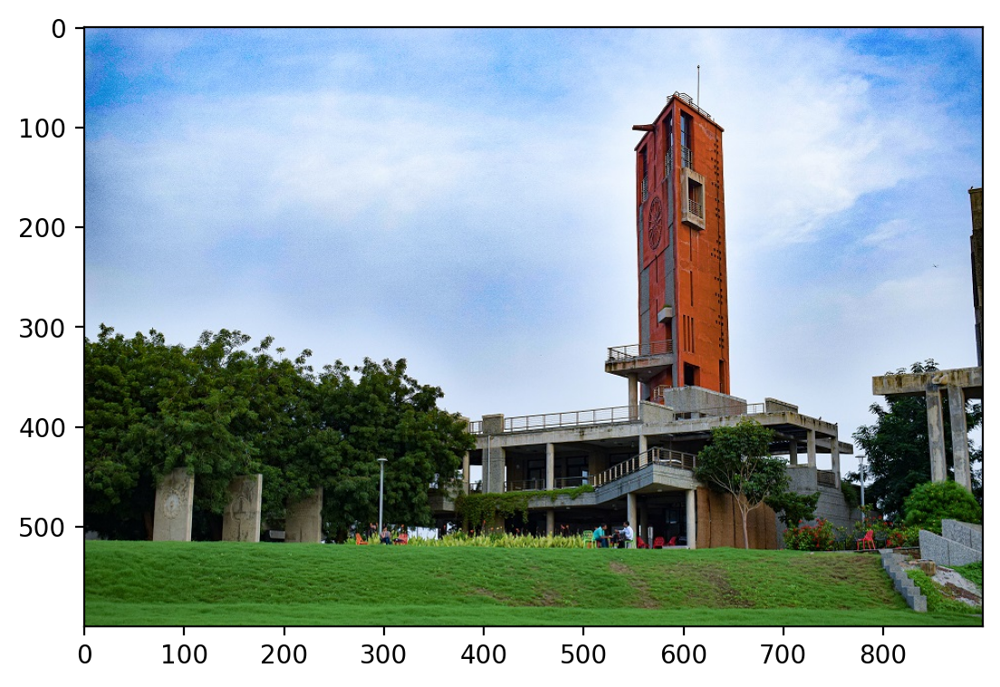

In [ ]:
plt.imshow(rearrange(img, 'c h w -> h w c').numpy())
# plt.axis('off')
plt.show()

In [ ]:
from sklearn import preprocessing
# scaling the image tensor
scaler_img = preprocessing.MinMaxScaler().fit(img.reshape(-1, 1))
scaler_img

MinMaxScaler()

In [ ]:
# apply the fitted scalar to the reshaped image  , and then reshape back to the original dimensions
img_scaled = scaler_img.transform(img.reshape(-1, 1)).reshape(img.shape)
print(img_scaled.shape)
img_scaled = torch.tensor(img_scaled)

(3, 600, 900)


In [ ]:
img_scaled = img_scaled.to(device)
img_scaled

tensor([[[0.5412, 0.5333, 0.4863,  ..., 0.5451, 0.5608, 0.5412],
         [0.5059, 0.5373, 0.5059,  ..., 0.5647, 0.5451, 0.5451],
         [0.5412, 0.5333, 0.5098,  ..., 0.5647, 0.5216, 0.5373],
         ...,
         [0.2627, 0.2941, 0.2549,  ..., 0.2314, 0.2157, 0.1843],
         [0.1647, 0.1647, 0.1882,  ..., 0.2314, 0.2196, 0.2078],
         [0.2039, 0.2275, 0.2588,  ..., 0.2157, 0.2039, 0.2157]],

        [[0.6902, 0.6902, 0.6667,  ..., 0.6667, 0.6824, 0.6627],
         [0.6549, 0.6941, 0.6667,  ..., 0.6863, 0.6667, 0.6667],
         [0.6784, 0.6706, 0.6471,  ..., 0.6863, 0.6431, 0.6588],
         ...,
         [0.4667, 0.4980, 0.4588,  ..., 0.4157, 0.4000, 0.3686],
         [0.3647, 0.3647, 0.3882,  ..., 0.4157, 0.4039, 0.3922],
         [0.4039, 0.4275, 0.4588,  ..., 0.4000, 0.3882, 0.4000]],

        [[0.9333, 0.9294, 0.9020,  ..., 0.9294, 0.9451, 0.9255],
         [0.8980, 0.9333, 0.9098,  ..., 0.9490, 0.9294, 0.9294],
         [0.9294, 0.9216, 0.9059,  ..., 0.9412, 0.8980, 0.

## Crop the image

In [ ]:
# Functional Crop
crop = torchvision.transforms.functional.crop(img_scaled.cpu(), 250, 400, 300, 300)
crop.shape

# # Center crop
# center_crop = torchvision.transforms.CenterCrop(300)  # Crop to a 300x300 square
# crop = center_crop(img_scaled.cpu())
# print(crop.shape)


torch.Size([3, 300, 300])

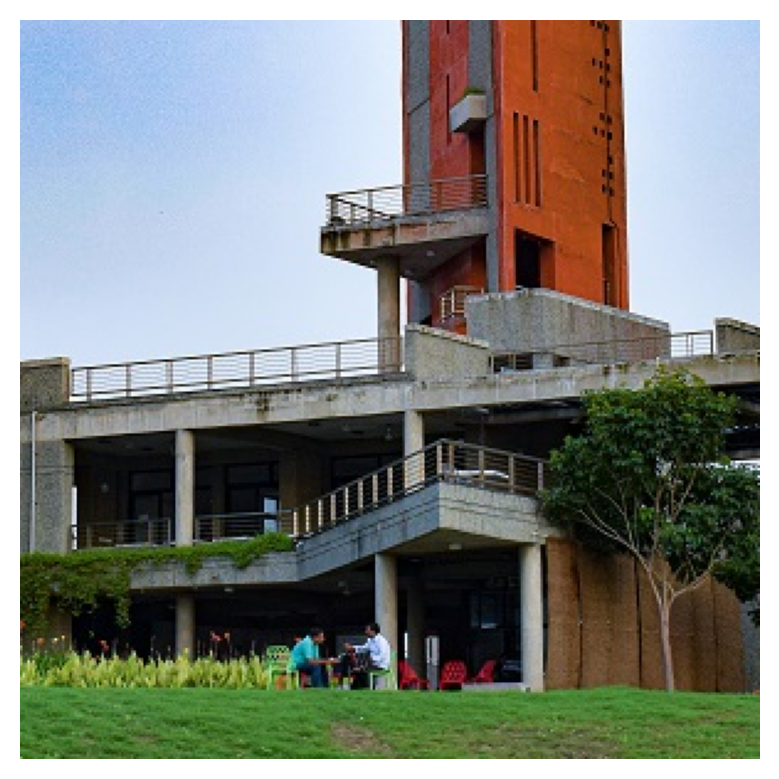

In [ ]:
plt.imshow(rearrange(crop, 'c h w -> h w c').cpu().numpy())
plt.axis('off')
plt.show()

In [ ]:
crop = crop.to(device)

## Create a coordinate map

In [ ]:
def create_coordinate_map(img):
    """
    img: torch.Tensor of shape (num_channels, height, width)

    return: tuple of torch.Tensor of shape (height * width, 2) and torch.Tensor of shape (height * width, num_channels)
    """

    num_channels, height, width = img.shape
    print("Number of channels:", num_channels, "\nHeight:", height, "\nWidth:", width)
    # Create a 2D grid of (x,y) coordinates (h, w)
    # width values change faster than height values
    print("-"*50)

    w_coords = torch.arange(width).repeat(height, 1)
    h_coords = torch.arange(height).repeat(width, 1).t()
    w_coords = w_coords.reshape(-1)
    h_coords = h_coords.reshape(-1)

    # Combine the x and y coordinates into a single tensor
    X = torch.stack([h_coords, w_coords], dim=1).float()

    # Move X to GPU if available
    X = X.to(device)
    print("X shape:", X.shape)

    # Reshape the image to (h * w, num_channels)
    Y = rearrange(img, 'c h w -> (h w) c').float()
    print("Y shape:", Y.shape)

    return X, Y

In [ ]:
img_X, img_Y = create_coordinate_map(crop)

print("-"*50)
print(img_X) # (300*300, 2)- coordinates
print(img_X.shape)
print(img_Y) # (300*300, 3)- RGB values
print(img_Y.shape)

Number of channels: 3 
Height: 300 
Width: 300
--------------------------------------------------
X shape: torch.Size([90000, 2])
Y shape: torch.Size([90000, 3])
--------------------------------------------------
tensor([[  0.,   0.],
        [  0.,   1.],
        [  0.,   2.],
        ...,
        [299., 297.],
        [299., 298.],
        [299., 299.]])
torch.Size([90000, 2])
tensor([[0.6157, 0.7373, 0.9176],
        [0.6196, 0.7412, 0.9216],
        [0.6118, 0.7333, 0.9137],
        ...,
        [0.3765, 0.5490, 0.2471],
        [0.3686, 0.5412, 0.2392],
        [0.3686, 0.5373, 0.2275]])
torch.Size([90000, 3])


In [ ]:
# MinMaxScaler from -1 to 1 - helps in numerical calculation while training neural network
scaler_X = preprocessing.MinMaxScaler(feature_range=(-1, 1)).fit(img_X.cpu())

# Scale the X coordinates
img_X_scaled = scaler_X.transform(img_X.cpu())

# Move the scaled X coordinates to the GPU
img_X_scaled = torch.tensor(img_X_scaled).to(device)

# Set to dtype float32
img_X_scaled = img_X_scaled.float()

### Functions to Calculate RMSE and PSNR

In [ ]:
def calculate_metrics(original_image, reconstructed_image, max_pixel_value=1.0):
    """
    Calculate RMSE and PSNR between the original and reconstructed images.

    Parameters:
    - original_image (torch.Tensor): The original image tensor.
    - reconstructed_image (torch.Tensor): The reconstructed image tensor.
    - max_pixel_value (float): The maximum pixel value for PSNR calculation.

    Returns:
    - rmse (float): The Root Mean Squared Error.
    - psnr (float): The Peak Signal-to-Noise Ratio.
    """
    # Ensure the images are on the same device
    original_image = original_image.to(reconstructed_image.device)

    # Calculate RMSE
    mse = torch.mean((original_image - reconstructed_image) ** 2)
    rmse = torch.sqrt(mse).item()

    # Calculate PSNR
    if mse == 0:  # MSE is zero means images are identical
        psnr = float('inf')
    else:
        psnr = 20 * torch.log10(max_pixel_value / torch.sqrt(mse)).item()

    return rmse, psnr


### Defining Linear Model

In [ ]:
# linear Regression - neural  network with one input and output layer - no hidden layers
class LinearModel(nn.Module):
    def __init__(self, input_dim, output_dim):
        super(LinearModel, self).__init__()
        # Define a linear transformation
        self.linear = nn.Linear(input_dim, output_dim)

    def forward(self, x):
        return self.linear(x)

## Reconstructing using Linear Model

In [ ]:
'''
Efficient Approach - Saves precision
for epoch in range(1, epochs+1):
    optimizer.zero_grad()  # Clears old gradients

    with autocast():
        outputs = net(X)
        loss = criterion(outputs, Y)

    scaler.scale(loss).backward()
    scaler.step(optimizer)
    scaler.update()

    losses.append(loss.item())

    if verbose and epoch % 200 == 0:
        print(f"Epoch {epoch} loss: {loss.item():.6f}")

'''

def train(net, lr, X, Y, epochs, batch_size=None, mini_batch=False, verbose=True,loss_change_threshold=1e-20,patience=10):

    criterion = nn.MSELoss()  # Loss function
    optimizer = optim.Adam(net.parameters(), lr=lr)  # Optimizer

    losses = []
    print("Start Training")

    if mini_batch:
        print("Performing mini-batch gradient descent")
        # Mini-Batch Gradient Descent
        dataset = TensorDataset(X, Y)
        data_loader = DataLoader(dataset, batch_size=batch_size, shuffle=True)

        for epoch in range(1, epochs+1):
            epoch_loss = 0
            for batch_X, batch_Y in data_loader:
                optimizer.zero_grad()  # Clears old gradients
                output = net(batch_X)  # Forward pass
                loss = criterion(output, batch_Y)  # Compute loss
                loss.backward()  # Backward pass
                optimizer.step()  # Update weights

                epoch_loss += loss.item()

            losses.append(epoch_loss / len(data_loader))

            if verbose and epoch % 100 == 0:
                print(f"Epoch {epoch} loss: {epoch_loss / len(data_loader)}")

    else:
        print("Performing single-batch gradient descent")
        no_improvement =0
        # Single-Batch Gradient Descent
        for epoch in range(1,epochs+1):
            optimizer.zero_grad()  # Clears old gradients
            outputs = net(X)  # Forward pass

            loss = criterion(outputs, Y)  # Compute loss
            loss.backward()  # Backward pass
            optimizer.step()  # Update weights

            if verbose and (epoch)% 100 == 0:
                print(f"Epoch {epoch} loss: {loss.item():.6f}")

            losses.append(loss.item())

            if len(losses) > 1:
                loss_change = abs(losses[-1] - losses[-2])
                if loss_change < loss_change_threshold:
                    no_improvement += 1
                else:
                    no_improvement = 0

                if no_improvement > patience:
                    print(f"No significant improvement for {patience} epochs. Stopping training at epoch:{epoch}.")
                    break


    # Clear unused memory
    torch.cuda.empty_cache()
    print(f"Training Completed, Final loss = {losses[-1]}")
    return losses


Start Training
Performing single-batch gradient descent
Epoch 100 loss: 0.071823
Epoch 200 loss: 0.066443
Epoch 300 loss: 0.066442
No significant improvement for 10 epochs. Stopping training at epoch:354.
Training Completed, Final loss = 0.06644225865602493
--------------------------------------------------
LinearModel(
  (linear): Linear(in_features=2, out_features=3, bias=True)
)
--------------------------------------------------
Weights: Parameter containing:
tensor([[-0.3058, -0.0370],
        [-0.2546, -0.0994],
        [-0.3916, -0.1352]], requires_grad=True)
Bias: Parameter containing:
tensor([0.4522, 0.4688, 0.4457], requires_grad=True)
--------------------------------------------------


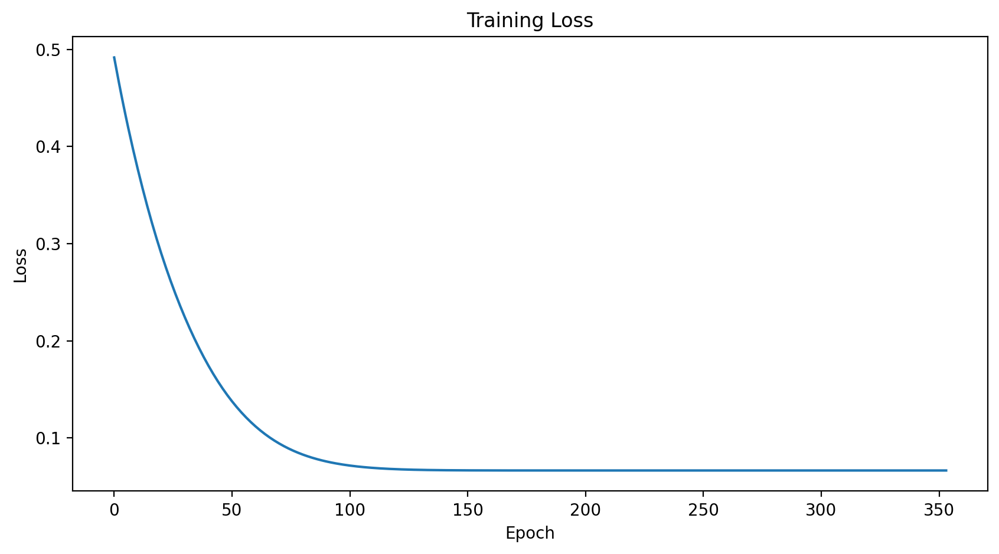

In [ ]:
net_1 = LinearModel(2, 3)
net_1.to(device)

losses_single = train(net_1, lr=0.01, X=img_X_scaled, Y=img_Y, epochs=1000)
print("-"*50)

print(net_1)
print("-"*50)
print("Weights:", net_1.linear.weight if torch.cuda.device_count() > 1 else net_1.linear.weight)
print("Bias:", net_1.linear.bias if torch.cuda.device_count() > 1 else net_1.linear.bias)
print("-"*50)


def plot_loss_graph(losses):
    # Plot training loss graph
    plt.figure(figsize=(10, 5))
    plt.plot(losses)
    plt.title("Training Loss")
    plt.xlabel("Epoch")
    plt.ylabel("Loss")
    plt.show()

plot_loss_graph(losses_single)

del losses_single

Output shape: torch.Size([1, 3, 300, 300])
RMSE: 0.2578
PSNR: 11.78 dB


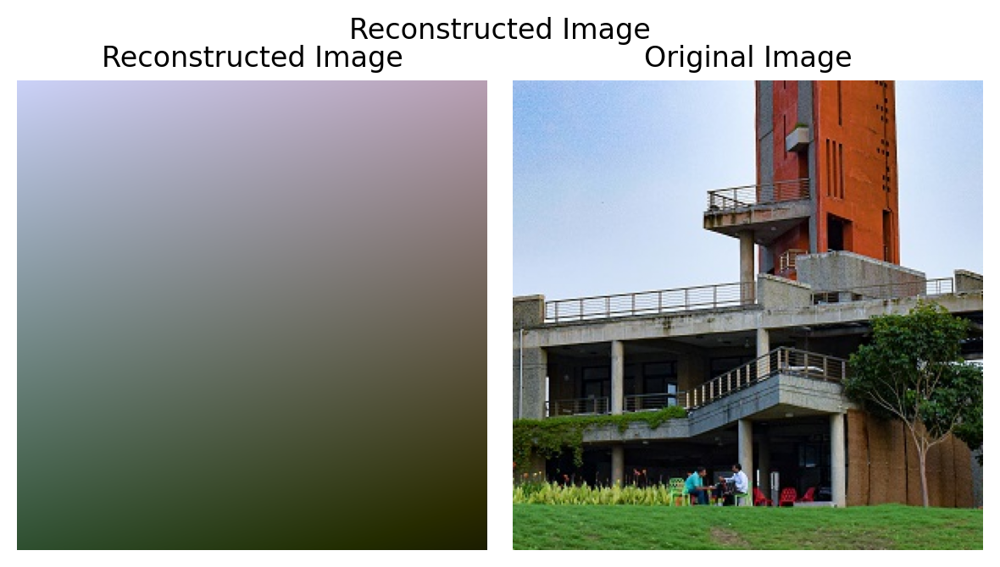

In [ ]:

def plot_reconstructed_and_original_image(original_img, net, X, title=""):
    """
    net: torch.nn.Module
    X: torch.Tensor of shape (num_samples, 2)
    Y: torch.Tensor of shape (num_samples, 3)
    """
    num_channels, height, width = original_img.shape
    net.eval() # Set model to evaluation mode
    with torch.no_grad(): # Disable gradient computation to save memory and computation
        outputs = net(X) # Perform forward pass without tracking gradients and get outputs
        outputs = outputs.reshape(height, width, num_channels)
    fig = plt.figure(figsize=(6, 4))
    gs = gridspec.GridSpec(1, 2, width_ratios=[1, 1])

    ax0 = plt.subplot(gs[0])
    ax1 = plt.subplot(gs[1])

    ax0.imshow(outputs.cpu()) #Show reconstructed image
    ax0.set_title("Reconstructed Image")


    ax1.imshow(original_img.cpu().permute(1, 2, 0)) # Show original image (permute channels)
    ax1.set_title("Original Image")

    for a in [ax0, ax1]:
        a.axis("off")


    fig.suptitle(title, y=0.9)
    plt.tight_layout()

    # Convert outputs to PyTorch tensor
    outputs_tensor = torch.tensor(outputs).permute(2, 0, 1).unsqueeze(0).to(device)
    print("Output shape:",outputs_tensor.shape)
    # Calculate metrics
    rmse, psnr = calculate_metrics(original_img, outputs_tensor)
    print(f"RMSE: {rmse:.4f}")
    print(f"PSNR: {psnr:.2f} dB")

    return rmse,psnr



plot_reconstructed_and_original_image(crop, net_1, img_X_scaled, title="Reconstructed Image")
del net_1

## Using Polynomial Basis Functions

In [ ]:
def normalize_image(image):
    """Normalize image to [0, 1] range for float images."""
    image_min = image.min()
    image_max = image.max()
    return (image - image_min) / (image_max - image_min)

def sigmoid(x):
    return 1 / (1 + torch.exp(-x))

def apply_sigmoid(image_tensor):
    """Apply sigmoid to image tensor to normalize it to [0, 1] range."""
    return sigmoid(image_tensor)

def clip(image_tensor):
    """Clip image tensor to [0, 1] range."""
    return torch.clamp(image_tensor, 0, 1)


--------------------------------------------------
Degree :5
Shape of featurised X torch.Size([90000, 21]), Shape of original image torch.Size([90000, 3])
LinearModel(
  (linear): Linear(in_features=21, out_features=3, bias=True)
)
Start Training
Performing single-batch gradient descent
Epoch 100 loss: 0.056483
Epoch 200 loss: 0.044921
Epoch 300 loss: 0.042542
Epoch 400 loss: 0.041639
Epoch 500 loss: 0.040942
Epoch 600 loss: 0.040327
Epoch 700 loss: 0.039783
Epoch 800 loss: 0.039304
Epoch 900 loss: 0.038887
Epoch 1000 loss: 0.038525
Epoch 1100 loss: 0.038215
Epoch 1200 loss: 0.037952
Epoch 1300 loss: 0.037729
Epoch 1400 loss: 0.037543
Epoch 1500 loss: 0.037389
Epoch 1600 loss: 0.037263
Epoch 1700 loss: 0.037159
Epoch 1800 loss: 0.037076
Epoch 1900 loss: 0.037010
Epoch 2000 loss: 0.036958
Epoch 2100 loss: 0.036918
Epoch 2200 loss: 0.036887
Epoch 2300 loss: 0.036863
Epoch 2400 loss: 0.036846
Epoch 2500 loss: 0.036833
Epoch 2600 loss: 0.036824
Epoch 2700 loss: 0.036818
Epoch 2800 loss: 0.

Epoch 3800 loss: 0.036805
No significant improvement for 10 epochs. Stopping training at epoch:3847.
Training Completed, Final loss = 0.03680548444390297
Output shape: torch.Size([1, 3, 300, 300])
RMSE: 0.1918
PSNR: 14.34 dB
--------------------------------------------------
Degree :10
Shape of featurised X torch.Size([90000, 66]), Shape of original image torch.Size([90000, 3])
LinearModel(
  (linear): Linear(in_features=66, out_features=3, bias=True)
)
Start Training
Performing single-batch gradient descent
Epoch 100 loss: 0.047530
Epoch 200 loss: 0.040659
Epoch 300 loss: 0.037811
Epoch 400 loss: 0.036312
Epoch 500 loss: 0.035424
Epoch 600 loss: 0.034835
Epoch 700 loss: 0.034400
Epoch 800 loss: 0.034050
Epoch 900 loss: 0.033749
Epoch 1000 loss: 0.033480
Epoch 1100 loss: 0.033235
Epoch 1200 loss: 0.033009
Epoch 1300 loss: 0.032801
Epoch 1400 loss: 0.032608
Epoch 1500 loss: 0.032430
Epoch 1600 loss: 0.032266
Epoch 1700 loss: 0.032114
Epoch 1800 loss: 0.031974
Epoch 1900 loss: 0.031844
E

Epoch 5000 loss: 0.030054
Training Completed, Final loss = 0.03005407191812992
Output shape: torch.Size([1, 3, 300, 300])
RMSE: 0.1734
PSNR: 15.22 dB
--------------------------------------------------
Degree :50
Shape of featurised X torch.Size([90000, 1326]), Shape of original image torch.Size([90000, 3])
LinearModel(
  (linear): Linear(in_features=1326, out_features=3, bias=True)
)
Start Training
Performing single-batch gradient descent
Epoch 100 loss: 0.044510
Epoch 200 loss: 0.038753
Epoch 300 loss: 0.036260
Epoch 400 loss: 0.034850
Epoch 500 loss: 0.033968
Epoch 600 loss: 0.033357
Epoch 700 loss: 0.032897
Epoch 800 loss: 0.032524
Epoch 900 loss: 0.032209
Epoch 1000 loss: 0.031935
Epoch 1100 loss: 0.031694
Epoch 1200 loss: 0.031484
Epoch 1300 loss: 0.031289
Epoch 1400 loss: 0.031108
Epoch 1500 loss: 0.030953
Epoch 1600 loss: 0.030815
Epoch 1700 loss: 0.030670
Epoch 1800 loss: 0.030551
Epoch 1900 loss: 0.030436
Epoch 2000 loss: 0.030377
Epoch 2100 loss: 0.030229
Epoch 2200 loss: 0.0

Epoch 5000 loss: 0.028815
Training Completed, Final loss = 0.0288150142878294
Output shape: torch.Size([1, 3, 300, 300])
RMSE: 0.1698
PSNR: 15.40 dB
--------------------------------------------------


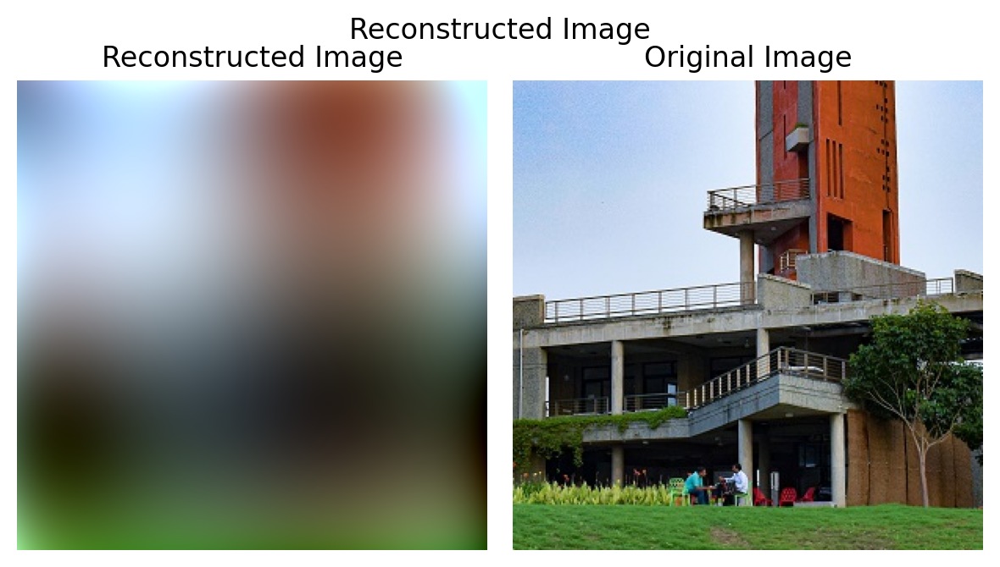

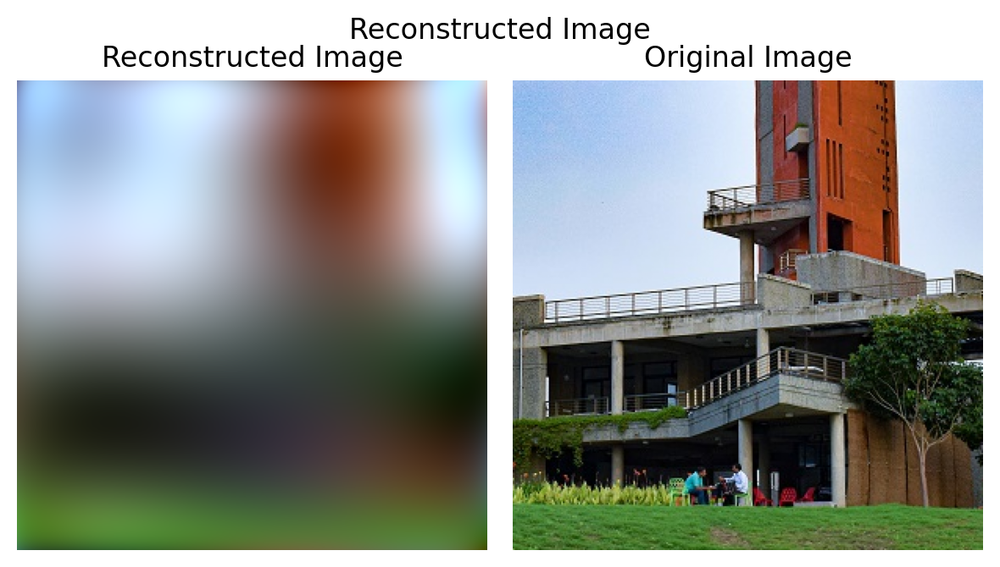

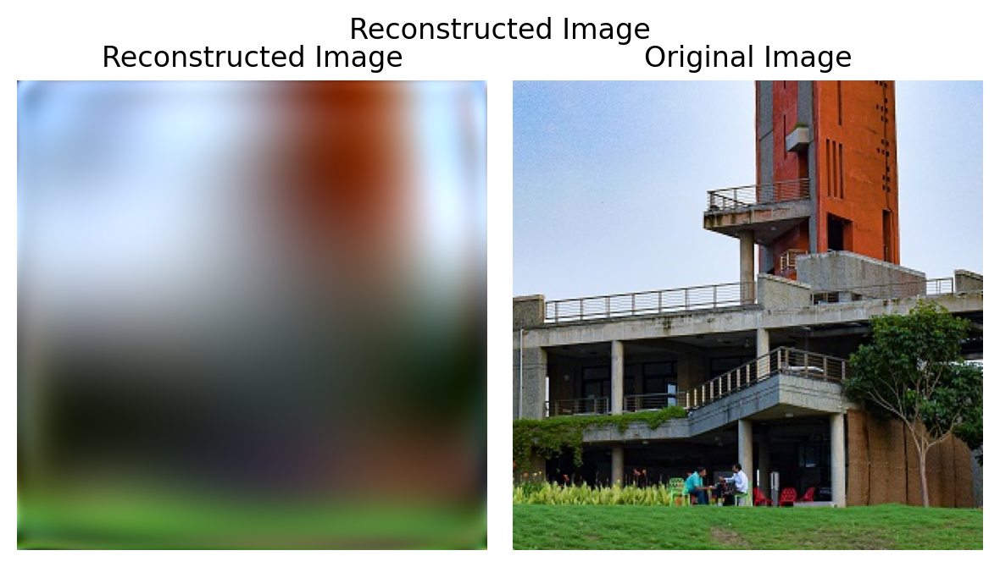

In [ ]:
# Define polynomial degrees to test
degrees = [5, 10,50]
# device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
# print("Device: ",device)

def poly_features(X, degree):
    """
    X: torch.Tensor of shape (num_samples, 2) - Input features
    degree: int - Degree of polynomial features

    return: torch.Tensor of shape (num_samples, degree * (degree + 1) / 2)
    """
    X1 = X[:, 0].unsqueeze(1)  # Extract and reshape first feature
    X2 = X[:, 1].unsqueeze(1)  # Extract and reshape second feature
    X = torch.cat([X1, X2], dim=1)  # Combine features

    poly = preprocessing.PolynomialFeatures(degree=degree)  # Initialize polynomial feature transformer
    X = poly.fit_transform(X.cpu())  # Generate polynomial features

    return torch.tensor(X, dtype=torch.float32).to(device)  # Convert to tensor and move to device


training_loss_history = []

print("-"*50)
for degree in degrees:
    # Generate polynomial features
    poly_features_X = poly_features(img_X_scaled, degree)
    print(f"Degree :{degree}\nShape of featurised X {poly_features_X.shape}, Shape of original image {img_Y.shape}")
    net_p = LinearModel(poly_features_X.shape[1], 3)
    print(net_p)
    net_p.to(device)

    losses_poly = train(net_p, lr=0.005, X=poly_features_X, Y=img_Y, epochs=5000)
    training_loss_history.append(losses_poly)
    plot_reconstructed_and_original_image(crop, net_p, poly_features_X, title="Reconstructed Image")
    del net_p , poly_features_X,losses_poly
    print("-"*50)


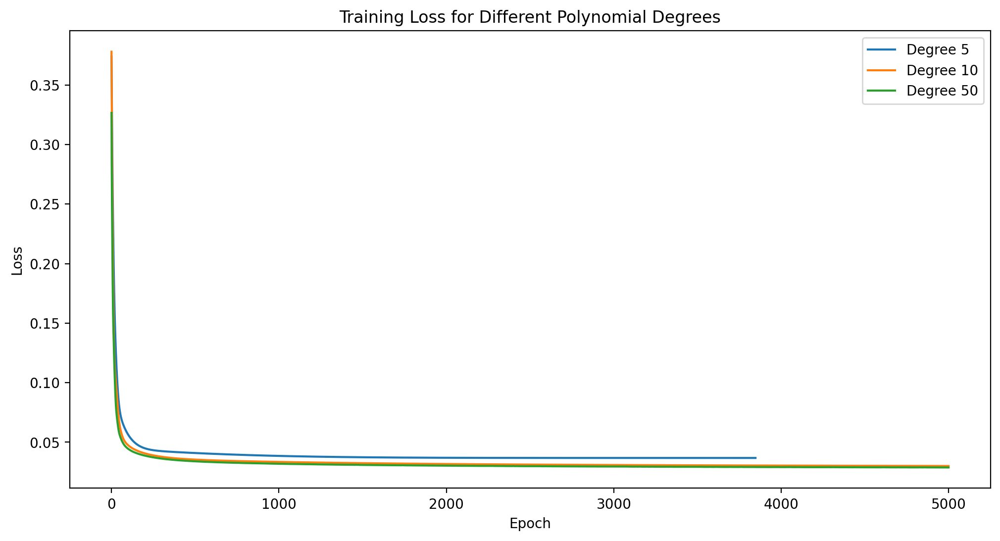

In [ ]:
# Plot all training losses in a single plot
plt.figure(figsize=(12, 6))
for i, degree in enumerate(degrees):
    plt.plot(training_loss_history[i], label=f'Degree {degree}')
plt.title("Training Loss for Different Polynomial Degrees")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.legend()
plt.show()

del training_loss_history

In [ ]:
import gc
import os
import psutil
import torch

def print_memory_usage():
    process = psutil.Process(os.getpid())
    memory_info = process.memory_info()
    print(f"Memory Usage: {memory_info.rss / 1024 ** 2:.2f} MB")

def clear_memory():
    torch.cuda.empty_cache()
    gc.collect()
    print_memory_usage()

# Call this function to print and clear memory
clear_memory()


Memory Usage: 529.57 MB


## Reconstructing using Random Fourier Features

In [ ]:
import matplotlib.pyplot as plt
from sklearn.kernel_approximation import RBFSampler

torch.cuda.empty_cache()
# create RFF features
def create_rff_features(X, num_features, sigma):
    rff = RBFSampler(n_components=num_features, gamma=1/(2 * sigma**2))
    X = X.cpu().numpy()
    X = rff.fit_transform(X)
    return torch.tensor(X, dtype=torch.float32).to(device)


torch.Size([90000, 37500])
Start Training
Performing single-batch gradient descent
Epoch 100 loss: 0.065773
Epoch 200 loss: 0.041254
Epoch 300 loss: 0.029317
Epoch 400 loss: 0.021250
Epoch 500 loss: 0.015632
Epoch 600 loss: 0.011695
Epoch 700 loss: 0.008950
Epoch 800 loss: 0.007055
Epoch 900 loss: 0.005767
Epoch 1000 loss: 0.004905
Epoch 1100 loss: 0.004339
Epoch 1200 loss: 0.003973
Epoch 1300 loss: 0.003740
Epoch 1400 loss: 0.003593
Epoch 1500 loss: 0.003502
Epoch 1600 loss: 0.003446
Epoch 1700 loss: 0.003411
Epoch 1800 loss: 0.003390
Epoch 1900 loss: 0.003376
Epoch 2000 loss: 0.003367
Epoch 2100 loss: 0.003361
Epoch 2200 loss: 0.003356
Epoch 2300 loss: 0.003353
Epoch 2400 loss: 0.003349
Epoch 2500 loss: 0.003347
Epoch 2600 loss: 0.003345
Epoch 2700 loss: 0.003342
Epoch 2800 loss: 0.003341
Epoch 2900 loss: 0.003339
Epoch 3000 loss: 0.003337
Epoch 3100 loss: 0.003336
Epoch 3200 loss: 0.003334
Epoch 3300 loss: 0.003333
Epoch 3400 loss: 0.003332
Epoch 3500 loss: 0.003331
Epoch 3600 loss:

Output shape: torch.Size([1, 3, 300, 300])
RMSE: 0.0576
PSNR: 24.79 dB


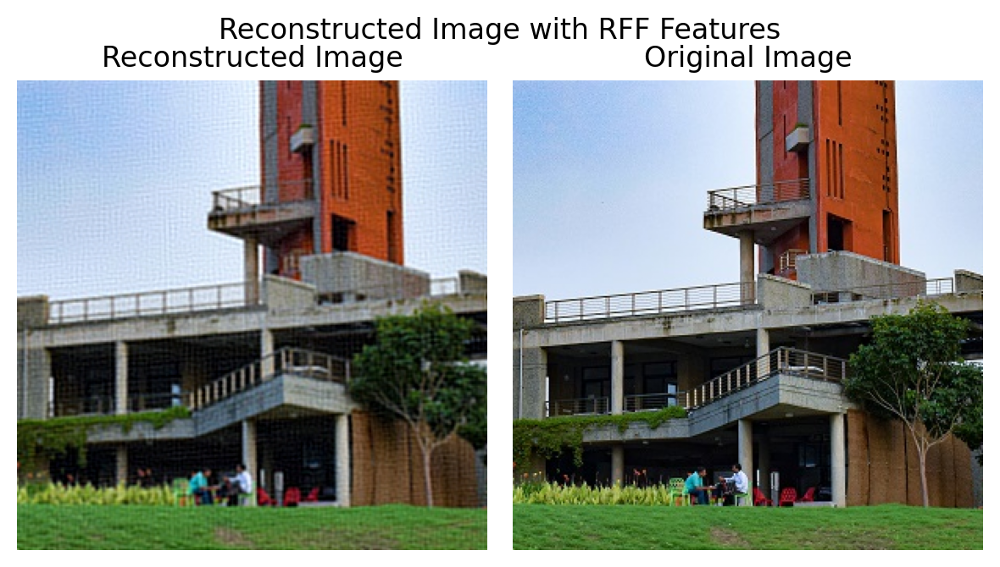

In [ ]:
X_rff = create_rff_features(img_X_scaled, 37500, 0.008)
print(X_rff.shape)

net_rff = LinearModel(X_rff.shape[1],3)
net_rff.to(device)

losses_rff = train(net_rff, lr=0.005, X=X_rff, Y=img_Y, epochs=5000, verbose=True)
plot_reconstructed_and_original_image(crop, net_rff, X_rff, title="Reconstructed Image with RFF Features")
del net_rff,losses_rff,X_rff


--------------------------------------------------
torch.Size([90000, 1000])
Start Training
Performing single-batch gradient descent
Epoch 100 loss: 0.107674
Epoch 200 loss: 0.098446
Epoch 300 loss: 0.098244
Epoch 400 loss: 0.098215
Epoch 500 loss: 0.098209
Epoch 600 loss: 0.098207
Epoch 700 loss: 0.098207
Epoch 800 loss: 0.098207
Epoch 900 loss: 0.098207
Epoch 1000 loss: 0.098207
Epoch 1100 loss: 0.098207
Epoch 1200 loss: 0.098207
Epoch 1300 loss: 0.098207
Epoch 1400 loss: 0.098207
Epoch 1500 loss: 0.098207
Epoch 1600 loss: 0.098207
Epoch 1700 loss: 0.098207
Epoch 1800 loss: 0.098207
Epoch 1900 loss: 0.098207
Epoch 2000 loss: 0.098207
Epoch 2100 loss: 0.098207
Epoch 2200 loss: 0.098207
Epoch 2300 loss: 0.098207
Epoch 2400 loss: 0.098207
Epoch 2500 loss: 0.098207
Training Completed, Final loss = 0.09820691496133804
Output shape: torch.Size([1, 3, 300, 300])
RMSE: 0.3134
PSNR: 10.08 dB
--------------------------------------------------
torch.Size([90000, 5000])
Start Training
Performing

Epoch 2500 loss: 0.050899
Training Completed, Final loss = 0.05089931562542915
Output shape: torch.Size([1, 3, 300, 300])
RMSE: 0.2256
PSNR: 12.93 dB
--------------------------------------------------
torch.Size([90000, 10000])
Start Training
Performing single-batch gradient descent
Epoch 100 loss: 0.083242
Epoch 200 loss: 0.061617
Epoch 300 loss: 0.051564
Epoch 400 loss: 0.044286
Epoch 500 loss: 0.038757
Epoch 600 loss: 0.034435
Epoch 700 loss: 0.030974
Epoch 800 loss: 0.028143
Epoch 900 loss: 0.025782
Epoch 1000 loss: 0.023778
Epoch 1100 loss: 0.022057
Epoch 1200 loss: 0.020564
Epoch 1300 loss: 0.019262
Epoch 1400 loss: 0.018121
Epoch 1500 loss: 0.017121
Epoch 1600 loss: 0.016243
Epoch 1700 loss: 0.015472
Epoch 1800 loss: 0.014796
Epoch 1900 loss: 0.014202
Epoch 2000 loss: 0.013680
Epoch 2100 loss: 0.013222
Epoch 2200 loss: 0.012818
Epoch 2300 loss: 0.012463
Epoch 2400 loss: 0.012148


Epoch 2500 loss: 0.011870
Training Completed, Final loss = 0.011870069429278374
Output shape: torch.Size([1, 3, 300, 300])
RMSE: 0.1089
PSNR: 19.26 dB
--------------------------------------------------
torch.Size([90000, 15000])
Start Training
Performing single-batch gradient descent
Epoch 100 loss: 0.081646
Epoch 200 loss: 0.064815
Epoch 300 loss: 0.056689
Epoch 400 loss: 0.050247
Epoch 500 loss: 0.044891
Epoch 600 loss: 0.040329
Epoch 700 loss: 0.036381
Epoch 800 loss: 0.032924
Epoch 900 loss: 0.029871
Epoch 1000 loss: 0.027154
Epoch 1100 loss: 0.024724
Epoch 1200 loss: 0.022539
Epoch 1300 loss: 0.020570
Epoch 1400 loss: 0.018791
Epoch 1500 loss: 0.017183
Epoch 1600 loss: 0.015730
Epoch 1700 loss: 0.014418
Epoch 1800 loss: 0.013236
Epoch 1900 loss: 0.012173
Epoch 2000 loss: 0.011222
Epoch 2100 loss: 0.010372
Epoch 2200 loss: 0.009617
Epoch 2300 loss: 0.008948
Epoch 2400 loss: 0.008359


Epoch 2500 loss: 0.007841
Training Completed, Final loss = 0.00784138310700655
Output shape: torch.Size([1, 3, 300, 300])
RMSE: 0.0885
PSNR: 21.06 dB
--------------------------------------------------


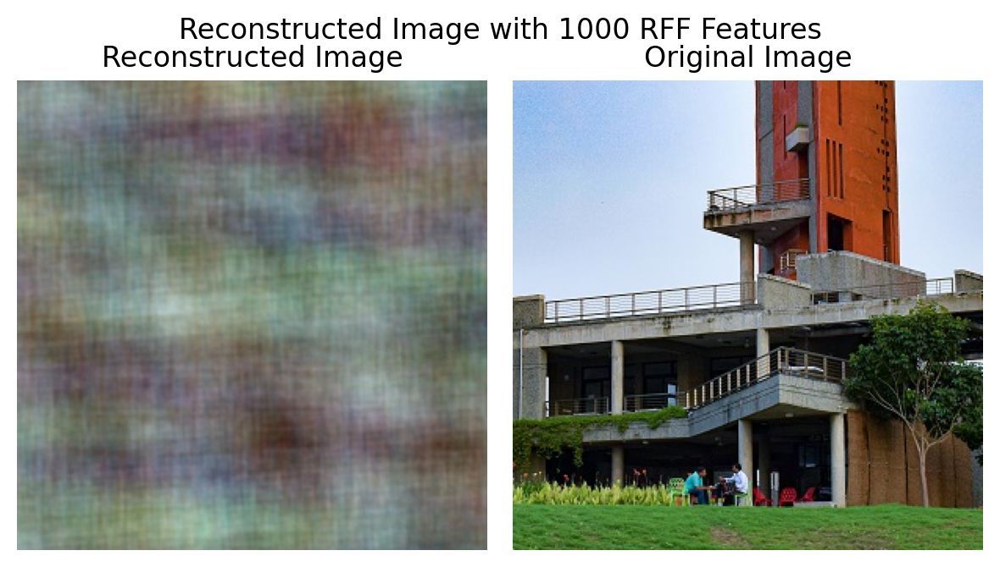

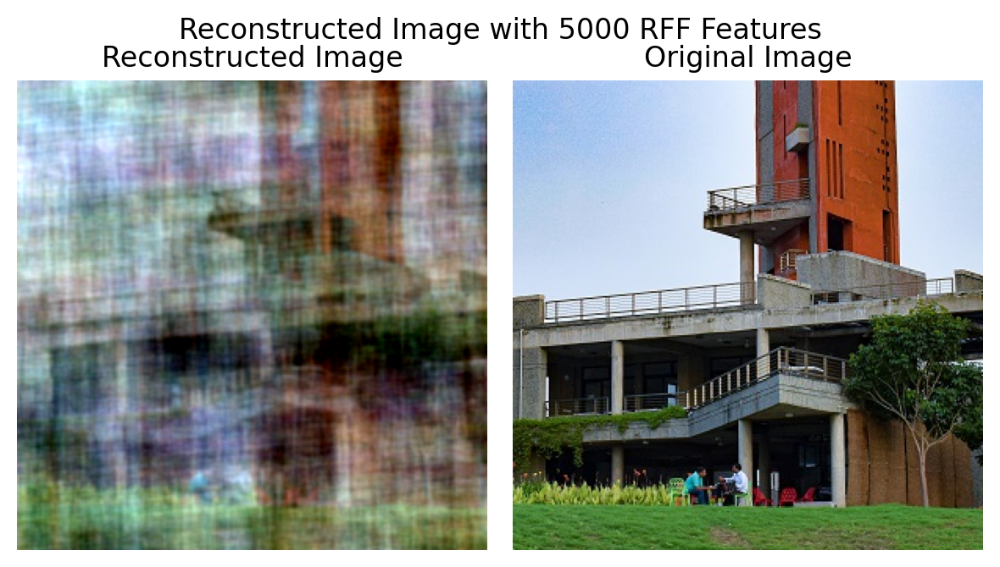

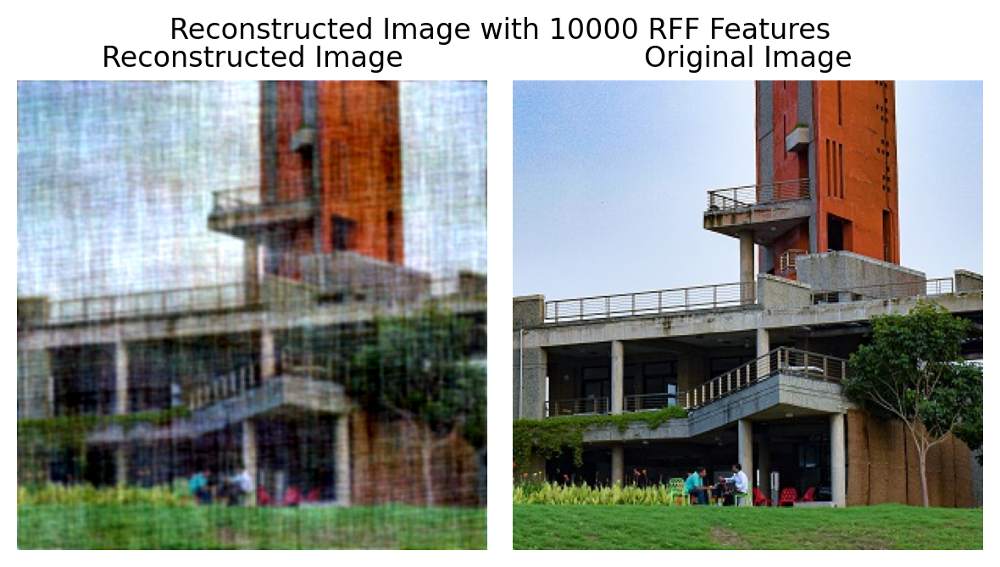

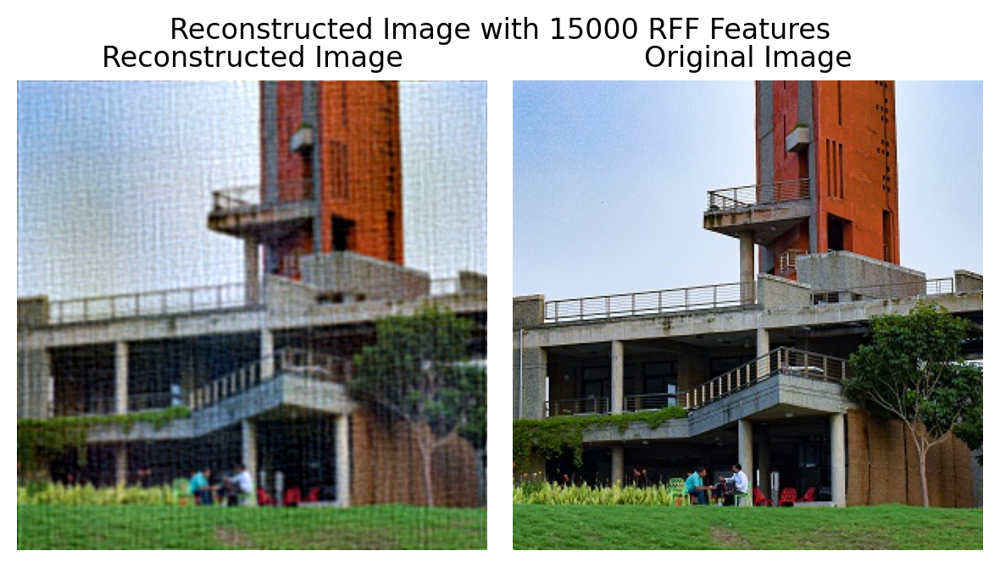

In [ ]:
features_list = [1000,5000,10000,15000]
rmse_f , psnr_f =[],[]
print("-"*50)

for feature in features_list:
    X_rff = create_rff_features(img_X_scaled, feature, 0.008)
    print(X_rff.shape)

    net = LinearModel(X_rff.shape[1],3)
    net.to(device)

    losses_rff = train(net, lr=0.005, X=X_rff, Y=img_Y, epochs=2500, verbose=True)
    rmse,psnr = plot_reconstructed_and_original_image(crop, net, X_rff, title=f"Reconstructed Image with {feature} RFF Features")
    rmse_f.append(rmse)
    psnr_f.append(psnr)

    print("-"*50)
    del net,losses_rff,X_rff

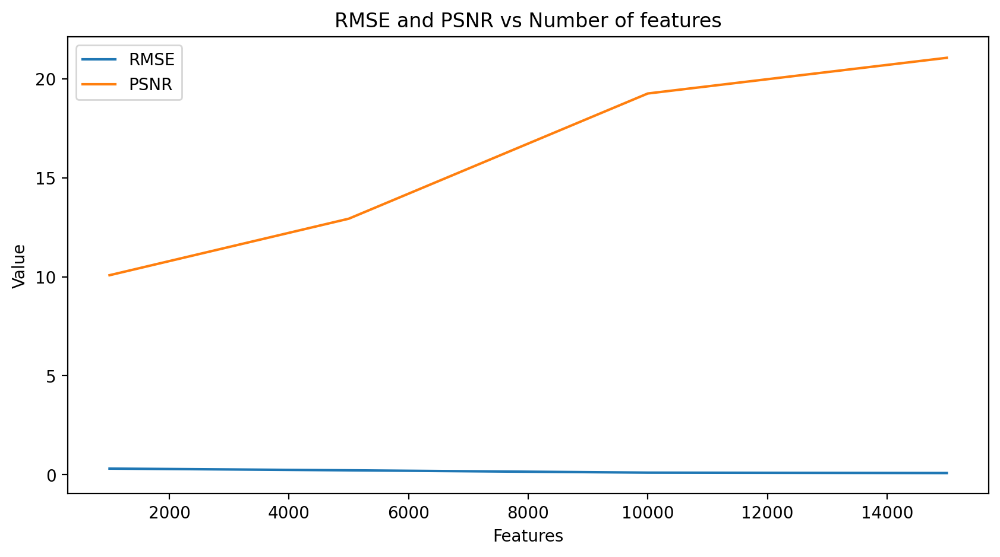

In [ ]:
#plot graph of rmse , psnr vs n_components for sigma  = 0.008
plt.figure(figsize=(10, 5))
plt.plot(features_list, rmse_f, label='RMSE')
plt.plot(features_list, psnr_f, label='PSNR')
plt.xlabel('Features')
plt.ylabel('Value')
plt.title('RMSE and PSNR vs Number of features')
plt.legend()
plt.show()

--------------------------------------------------
torch.Size([90000, 10000])
Start Training
Performing single-batch gradient descent
Epoch 100 loss: 0.107234
Epoch 200 loss: 0.097629
Epoch 300 loss: 0.096063
Epoch 400 loss: 0.094846
Epoch 500 loss: 0.093861
Epoch 600 loss: 0.093049
Epoch 700 loss: 0.092370
Epoch 800 loss: 0.091795
Epoch 900 loss: 0.091304
Epoch 1000 loss: 0.090882
Epoch 1100 loss: 0.090518
Epoch 1200 loss: 0.090203
Epoch 1300 loss: 0.089929
Epoch 1400 loss: 0.089692
Epoch 1500 loss: 0.089485
Epoch 1600 loss: 0.089305
Epoch 1700 loss: 0.089149
Epoch 1800 loss: 0.089013
Epoch 1900 loss: 0.088895
Epoch 2000 loss: 0.088794
Epoch 2100 loss: 0.088706
Epoch 2200 loss: 0.088630
Epoch 2300 loss: 0.088566
Epoch 2400 loss: 0.088512


Epoch 2500 loss: 0.088465
Training Completed, Final loss = 0.08846540004014969
Output shape: torch.Size([1, 3, 300, 300])
RMSE: 0.2974
PSNR: 10.53 dB
--------------------------------------------------
torch.Size([90000, 10000])
Start Training
Performing single-batch gradient descent
Epoch 100 loss: 0.085398
Epoch 200 loss: 0.070154
Epoch 300 loss: 0.064611
Epoch 400 loss: 0.060501
Epoch 500 loss: 0.057132
Epoch 600 loss: 0.054226
Epoch 700 loss: 0.051638
Epoch 800 loss: 0.049280
Epoch 900 loss: 0.047096
Epoch 1000 loss: 0.045049
Epoch 1100 loss: 0.043112
Epoch 1200 loss: 0.041270
Epoch 1300 loss: 0.039508
Epoch 1400 loss: 0.037819
Epoch 1500 loss: 0.036197
Epoch 1600 loss: 0.034636
Epoch 1700 loss: 0.033133
Epoch 1800 loss: 0.031686
Epoch 1900 loss: 0.030292
Epoch 2000 loss: 0.028950
Epoch 2100 loss: 0.027658
Epoch 2200 loss: 0.026415
Epoch 2300 loss: 0.025220
Epoch 2400 loss: 0.024072


Epoch 2500 loss: 0.022971
Training Completed, Final loss = 0.022970739752054214
Output shape: torch.Size([1, 3, 300, 300])
RMSE: 0.1515
PSNR: 16.39 dB
--------------------------------------------------
torch.Size([90000, 10000])
Start Training
Performing single-batch gradient descent
Epoch 100 loss: 0.014868
Epoch 200 loss: 0.014421
Epoch 300 loss: 0.014268
Epoch 400 loss: 0.014192
Epoch 500 loss: 0.014146
Epoch 600 loss: 0.014114
Epoch 700 loss: 0.014090
Epoch 800 loss: 0.014070
Epoch 900 loss: 0.014052
Epoch 1000 loss: 0.014037
Epoch 1100 loss: 0.014023
Epoch 1200 loss: 0.014010
Epoch 1300 loss: 0.013998
Epoch 1400 loss: 0.013987
Epoch 1500 loss: 0.013977
Epoch 1600 loss: 0.013967
Epoch 1700 loss: 0.013958
Epoch 1800 loss: 0.013950
Epoch 1900 loss: 0.013942
Epoch 2000 loss: 0.013934
Epoch 2100 loss: 0.013927
Epoch 2200 loss: 0.013920
Epoch 2300 loss: 0.013914
Epoch 2400 loss: 0.013908


Epoch 2500 loss: 0.013902
Training Completed, Final loss = 0.013901729136705399
Output shape: torch.Size([1, 3, 300, 300])
RMSE: 0.1179
PSNR: 18.57 dB
--------------------------------------------------


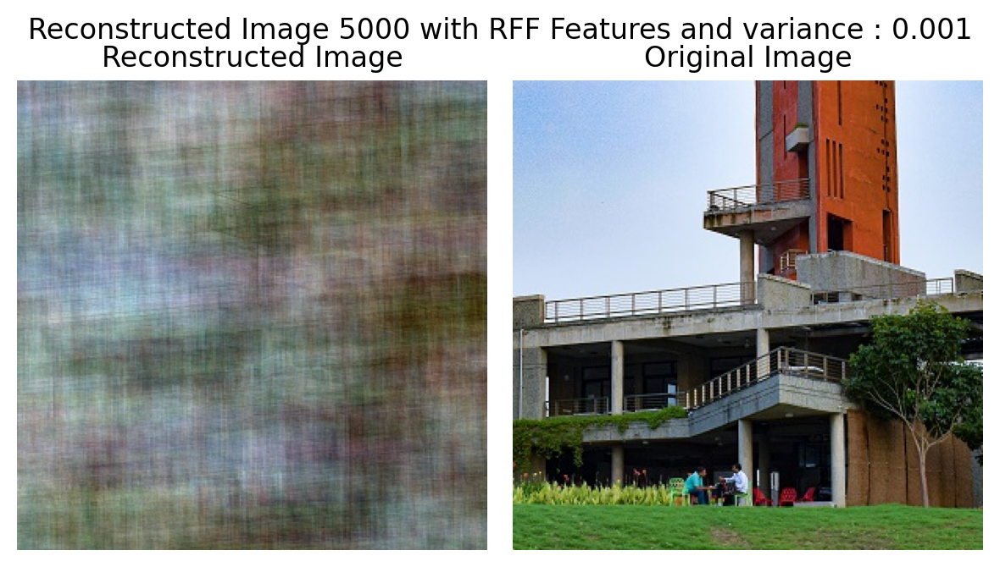

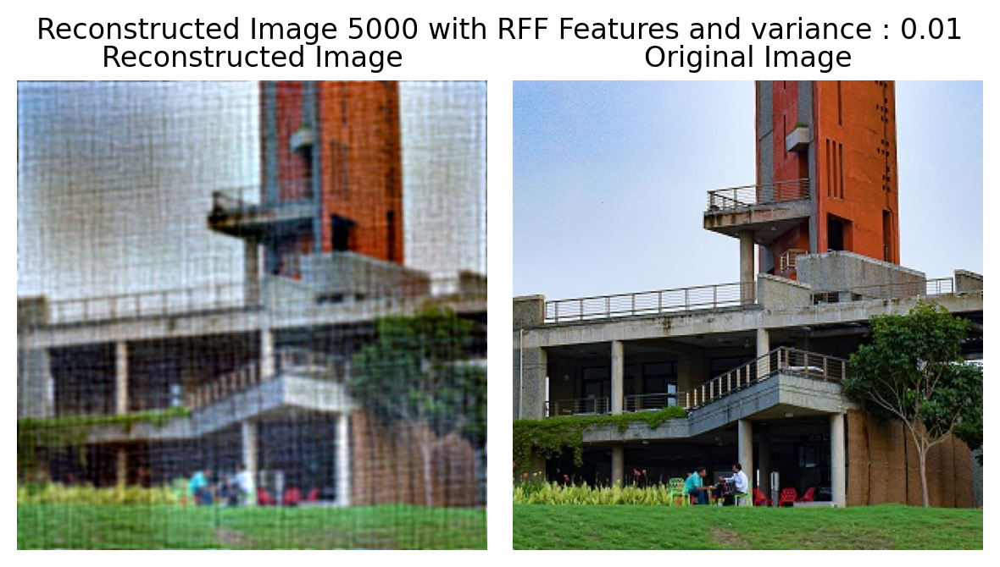

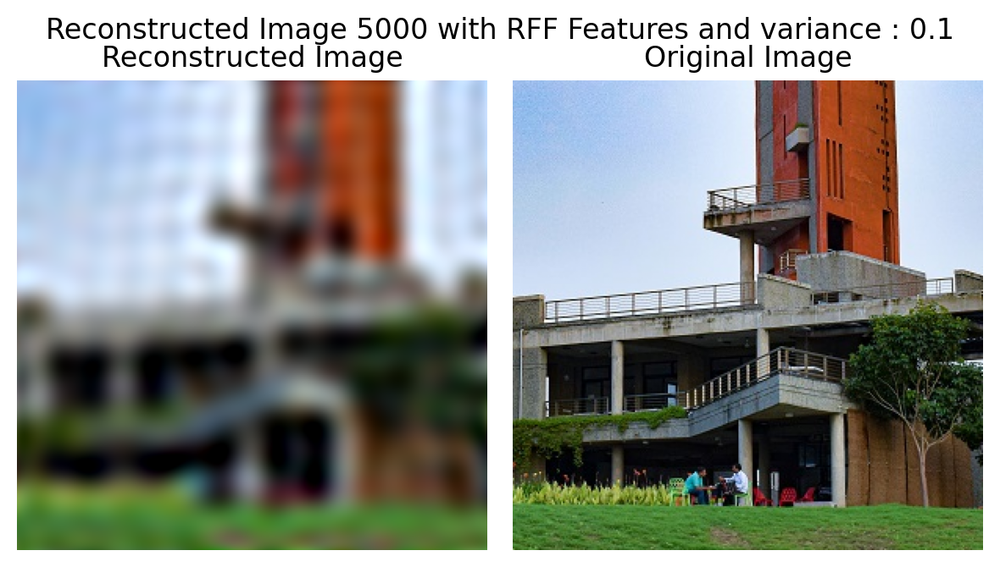

In [ ]:
sigma_list = [0.001,0.01,0.1]
rmse_s , psnr_s =[],[]

print("-"*50)
for sigma in sigma_list:
    X_rff = create_rff_features(img_X_scaled, 10000,sigma)
    print(X_rff.shape)

    net = LinearModel(X_rff.shape[1],3)
    net.to(device)

    losses_rff = train(net, lr=0.005, X=X_rff, Y=img_Y, epochs=2500, verbose=True)
    rmse , psnr = plot_reconstructed_and_original_image(crop, net, X_rff, title=f"Reconstructed Image 5000 with RFF Features and variance : {sigma}")
    rmse_s.append(rmse)
    psnr_s.append(psnr)

    print("-"*50)
    del net,losses_rff,X_rff

In [ ]:
torch.cuda.empty_cache()

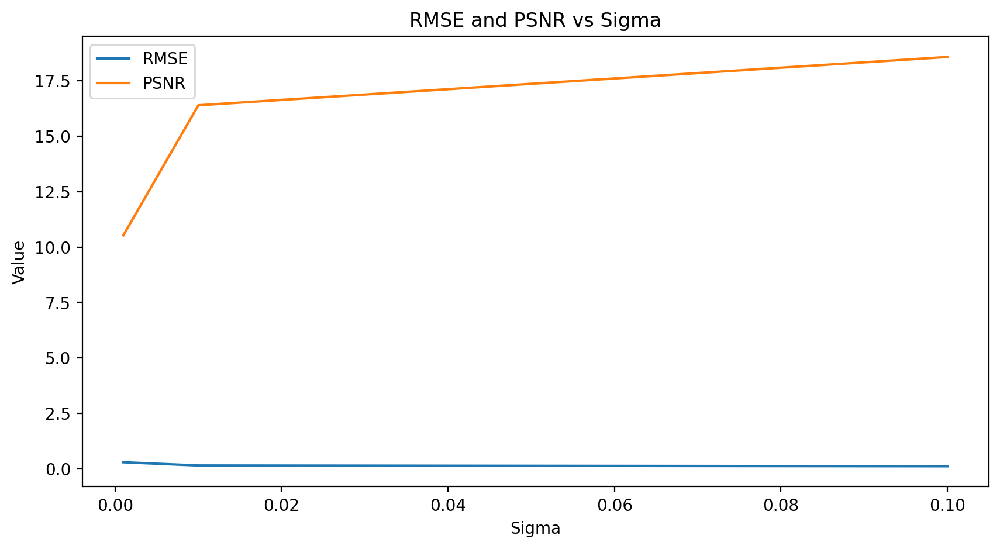

In [ ]:
# plot graph of rmse , psnr vs sigma for components = 10000
plt.figure(figsize=(10, 5))
plt.plot(sigma_list, rmse_s, label='RMSE')
plt.plot(sigma_list, psnr_s, label='PSNR')
plt.xlabel('Sigma')
plt.ylabel('Value')
plt.title('RMSE and PSNR vs Sigma')
plt.legend()
plt.show()


### **PSNR (Peak Signal-to-Noise Ratio) and SNR (Signal-to-Noise Ratio)**

**1. PSNR (Peak Signal-to-Noise Ratio):**

- **Purpose:** PSNR is a metric used to measure the quality of reconstructed or compressed images compared to the original image. It evaluates how much the reconstructed image deviates from the original image in terms of pixel values.

- **Calculation Steps:**
  1. **Compute the Mean Squared Error (MSE):**
     \[
     \text{MSE} = \frac{1}{M \times N} \sum_{i=1}^M \sum_{j=1}^N (I(i, j) - K(i, j))^2
     \]
     where \(I\) is the original image, \(K\) is the reconstructed image, and \(M\) and \(N\) are the dimensions of the image.

  2. **Calculate the Peak Signal-to-Noise Ratio (PSNR):**
     \[
     \text{PSNR} = 10 \times \log_{10} \left(\frac{R^2}{\text{MSE}}\right)
     \]
     where \(R\) is the maximum possible pixel value (e.g., 255 for an 8-bit image).

**2. SNR (Signal-to-Noise Ratio):**

- **Purpose:** SNR is a metric used to measure the quality of audio signals or any signal where you compare the signal strength to the background noise. It evaluates how much the useful signal is drowned out by the noise.

- **Calculation Steps:**
  1. **Compute the Signal Power (P_signal):**
     $$\[
     P_{\text{signal}} = \frac{1}{N} \sum_{i=1}^N x(i)^2
     \]$$
     where \(x(i)\) represents the signal samples and \(N\) is the number of samples.

  2. **Compute the Noise Power (P_noise):**
     $\[
     P_{\text{noise}} = \frac{1}{N} \sum_{i=1}^N n(i)^2
     \]$
     where \(n(i)\) represents the noise samples.

  3. **Calculate the Signal-to-Noise Ratio (SNR):**
     $\[
     \text{SNR} = 10 \times \log_{10} \left(\frac{P_{\text{signal}}}{P_{\text{noise}}}\right)
     \]$

### Summary

- **PSNR** is used for images to measure how much the reconstructed image deviates from the original image, focusing on pixel-level errors.
- **SNR** is used for audio signals (or other types of signals) to quantify the ratio of the signal power to the noise power, assessing the quality of the signal relative to background noise.
